In [37]:
#### Uncomment and run this cell once to install a few required packages which is probably not installed in your system
# !pip install yellowbrick
# !pip install fuzzy-c-means
# !python -m pip install -U scikit-image

###### Run the below cell and enjoy the rest of the notebook

In [38]:
#Python 101 libraries
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
import time

#Scipy
from scipy.spatial.distance import cdist

#Scikit-Learn(https://scikit-learn.org/stable/modules/clustering.html#clustering)
from sklearn.cluster import AgglomerativeClustering, KMeans, SpectralClustering
from sklearn.metrics import pairwise_distances_argmin
from sklearn.utils import shuffle
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import load_iris, load_sample_image

from sklearn.datasets import make_blobs,  make_moons, make_circles
from sklearn.metrics import adjusted_rand_score


#Yellowbrick extends the Scikit-Learn API and provides some very useful wrappers to create the visualization easily
from yellowbrick.cluster import SilhouetteVisualizer 

#Ignore annoying warnings
import warnings
warnings.filterwarnings('ignore')

# <center> Report on Clustering and various clustering techniques 

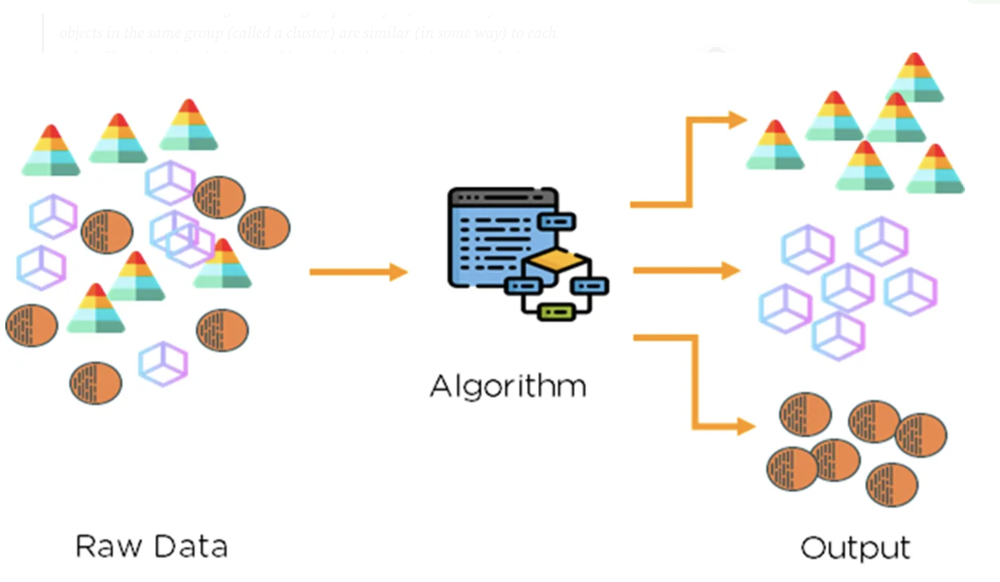

##### Contents

- Introduction
- K-Means
    - Implementing K-Means using only numpy
    - Directly usign the sklearn package
    - Hyperparameters
        - Exploring 'k' and different ways to calculate it
        - Other hyperparameters
- K-Means++
    - How is it different from K-Means
    - Implementing the K-Means++ using only numpy
    - Directly using the sklearn package
- Final thoughts on K-Means and K-Means++ 
- K-Means from an algorithmic perspective
- Applying the clustering techniques for image compression
- Another algorithm from the K-Means family- Fuzzy C Means
    - Implementing it using numpy
    - Directly implementing the available library
- Advanced clustering Technique - Spectral Clustering
    - Implemting it using numpy
    - Implementing it using sklearn
- The dark side of clustering and the algorithms explained above
- Conclusion

## Motivation 
In this notebook we are going to explore an unsupervised learning algorithm called <b> clustering </b>. We will be exploring the most famous clustering algorithms, <b> K-means </b> and <b> K-means++ </b>. We will implement them from scratch using only numpy, compare it with sklearn implementation. We will be exploring the most important hyper-parameters associated with these two algorithms. We will also look into two other clustering techniques which are <b> Fuzzy C means </b> and <b> Spectral Clustering </b>. Towards the end we will learn how and where this method is used using an image compression example. We will also get two know about how to evaluate these techniques. Along the way we will also focus on the algorithmic aspect of it and the math behind these techniques.  

**!! This notebook is created as part of USFCA-MSDS-689 course assignment. Please don't reproduce it in any way.!!**

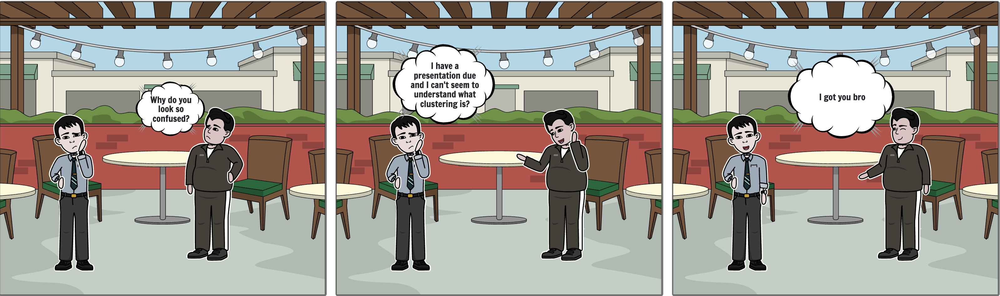

## Introduction

<b>Clustering</b> is a machine learning algorithm which divides the population of data points into groups such that data points in the same groups are similar to each other and dissimilar to the data points in other groups. It is basically a collection of objects on the basis of similarity and dissimilarity between them. 
With clustering algorithms we will be looking at distances between observations using the
features, usually some type of Euclidean distance. Often we want to first normalize our features
so that all features are on the same scale and no feature will dominate the distance measurement.
For our distance, we just have to make sure we follow these rules:

- the distance is always non-negative
- distance between points A and B is 0 only if A = B
- symmetry: dist(A,B) = dist(B,A)
- triangle inequality: dist(A,B) + dist(B,C) ≥ dist(A,C)

It is an unsupervised learning technique, in which we draw inferences from data consisting of no labeled responses. Generally, it is used as a process to find meaningful structure, explanatory underlying processes, generative features, and groupings inherent in a set of examples.

Clustering is a very useful methodology to find clusters of demographics in a city, identifying similar kind of cells in our body, clustering documents based on certain pattern and many more. The most famous clustering algorithm is <b>K-Means</b> and <b>K-Means++</b>. 

Below are the broad classifications of Clustering:
- Distribution models - Clusters in this model belong to a distribution. Data points are grouped based on the probability of belonging to either a normal or a gaussian distribution. The expectation-maximisation algorithm, which uses multivariate normal distributions, is one of the popular examples of this algorithm.

-  Centroid/Distance based models – This is an iterative algorithm in which data is organised into clusters based on how close data points are to the centre of clusters also known as centroid. An example of centroid models is the K-means algorithm.

- Connectivity/Hierarchical models – This is similar to the centroid model and is also known as Hierarchical clustering. It is a cluster analysis method that seeks to build a hierarchy of clusters. An example of a connectivity model is the hierarchical algorithm.

- Density models - Clusters are defined by areas of concentrated density. It searches areas of dense data points and assigns those areas to the same clusters. DBSCAN (Density-Based Spatial Clustering of Applications with Noise) and OPTICS are two popular density-based clustering models.

<b>K-Means</b> and <b>K-Means++</b> are the simplest unsupervised learning algorithm that solves clustering problem.These two algorithms partitions n observations into k clusters where each observation belongs to the cluster with the nearest mean serving as a prototype of the cluster.

## <B><u> K-Means</u></B>

<c> 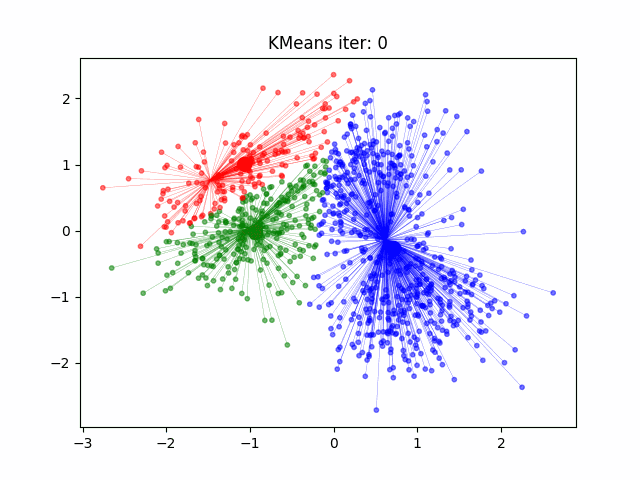 </c>

K-Means is a simple and efficient algorithm for partitioning a set of n points into k clusters. The algorithm uses an iterative approach to minimize the within-cluster sum of squared distances (WCSS) between the points and their closest cluster centers. The algorithm starts by randomly initializing k cluster centers, and then repeatedly updates the cluster assignments and the cluster centers until either the maximum number of iterations is reached or the cluster centers no longer change.

$$ WCSS = \sum_{i=1}^{n}\underset{\mu_{j} \in C}{min}((||x_{i}-\mu_{j}||^{2})) $$

where C is a cluster, and $μ_{j}$ is the cluster centroid(Cluster centroid corresponds to the arithmetic mean of data points assigned to the cluster ). Note that the cluster centroid is not necessarily a point in X. Typically, the distance function that we use, that we want to minimize,
is the Euclidean distance (in sklearn) but could also be the Manhattan distance (the L1 norm rather than L2 norm), which is the same as k-medians instead of k-means.

The algorithm is as follows:

- Pick a value for k
- Randomly choose k points in your feature space to act as your initial cluster centroids
- Assign observations to the centroid that is closest to them using a distance metric
- Recalculate the cluster centroids (use the average value of the observations in the cluster)
- Repeat the previous two steps until the cluster centroids or assignments do not change


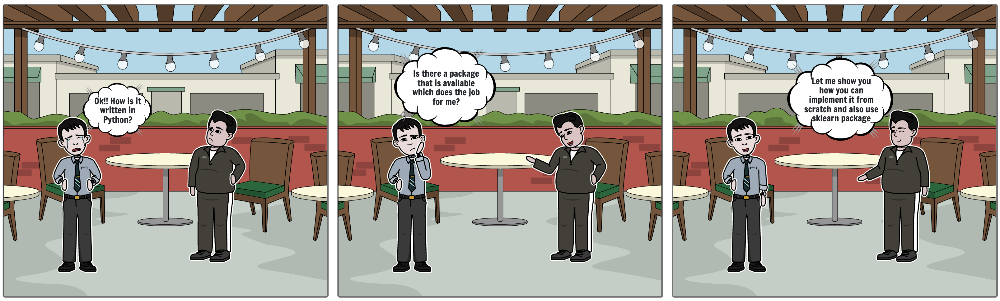

### [Numpy](https://numpy.org/doc/stable/user/whatisnumpy.html) implementation of K-Means Algorithm

In [39]:
# Set a fixed random seed
np.random.seed(0)

# Generate the random numbers
X = np.random.randn(100, 2)

# Print the output

X.shape

(100, 2)

##### <b> Remember one thing for K-Means or any distance based algorithm. You have to scale your data before you cluster them into groups else you will see problems arrising due to magnitude. In this notebook the range of numbers we used for demonstration pupose is not that large so we are safe but in case you have high number and dimension of data points please uncomment run the below code . </b>

In [40]:
# from sklearn.preprocessing import StandardScaler

# scaler = StandardScaler()
# data_scaled = scaler.fit_transform(X)

In [41]:
class KMeans_custom:
    def __init__(self, n_clusters, max_iter=100, random_state=0):
        self.n_clusters = n_clusters
        self.max_iter = max_iter
        self.random_state = random_state

    def fit(self, X):
        np.random.seed(self.random_state)
        self.cluster_centers_ = X[np.random.choice(X.shape[0], self.n_clusters, replace=False)]
        for _ in range(self.max_iter):
            distances = np.array([np.linalg.norm(X - center, axis=1) for center in self.cluster_centers_])
            closest_cluster = np.argmin(distances, axis=0)
            new_cluster_centers = np.array([X[closest_cluster == c].mean(axis=0) for c in range(self.n_clusters)])
            if np.all(self.cluster_centers_ == new_cluster_centers):
                break
            self.cluster_centers_ = new_cluster_centers

    def predict(self, X):
        distances = np.array([np.linalg.norm(X - center, axis=1) for center in self.cluster_centers_])
        closest_cluster = np.argmin(distances, axis=0)
        return closest_cluster

def visualize_clusters(X, y, centroids, title):
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis')
    plt.scatter(centroids[:, 0], centroids[:, 1], marker='o', s=200, linewidths=3, color='black', zorder=10)
    for i, c in enumerate(centroids):
        plt.scatter(c[0], c[1], marker='${}$'.format(i), s=50, color='black', zorder=10)
    plt.title(title)
    plt.show()

np.random.seed(0)

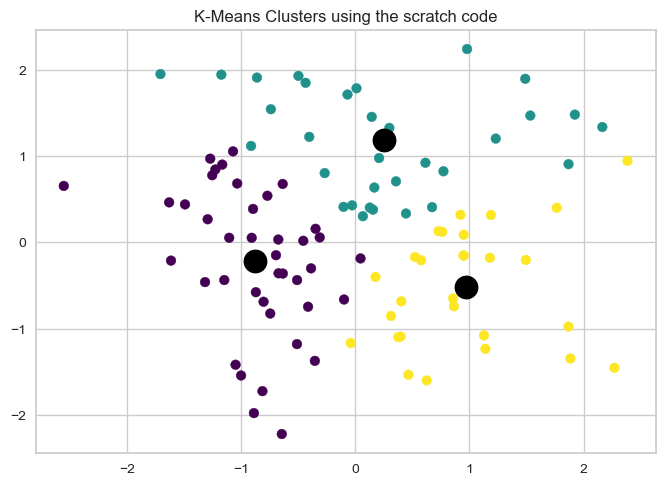

In [42]:
# Fit KMeans to the sample data
kmeans = KMeans_custom(n_clusters=3, random_state=0)
kmeans.fit(X)

# Predict cluster labels for the sample data
y_pred = kmeans.predict(X)
cluster_centers = kmeans.cluster_centers_

# Visualize the clusters
visualize_clusters(X, y_pred, cluster_centers,'K-Means Clusters using the scratch code')


### [Scikit-Learn](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html) implementation

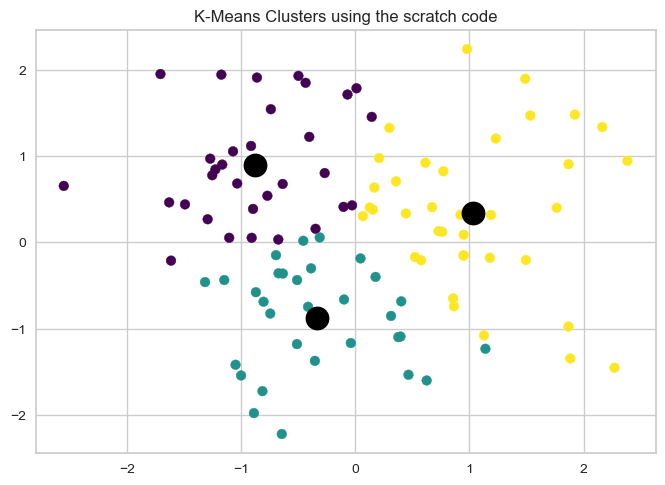

In [43]:
## !! The init method is set to random else Scikit-learn by default will implement the K-Means++ algorithm methodology as shown in section on K-Means++
kmeans= KMeans(n_clusters=3, init="random")
kmeans.fit(X)

y_pred = kmeans.predict(X)
cluster_centers = kmeans.cluster_centers_

visualize_clusters(X, y_pred, cluster_centers,'K-Means Clusters using the scratch code')



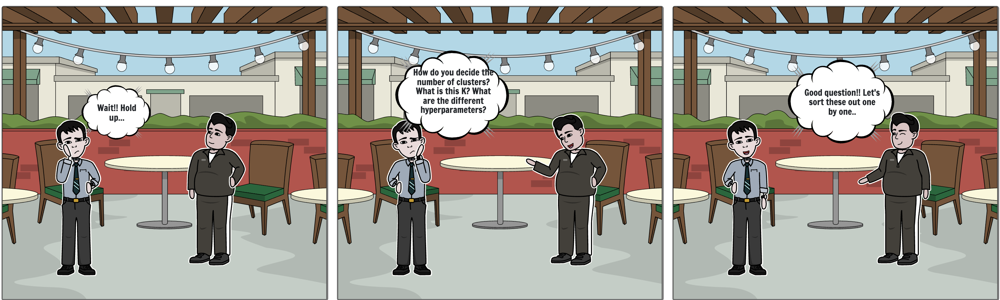

#### Exploring 'k' 

So k in simple terms is the number of clusters and the most important hyperparameter of this algorithm.

There are number of ways to find this 'k'. Let's check out the two most important ones in details but also touch upon a few more methodologies to calculate the number of clusters, k. 

#### <B>1. Elbow Method </B>

The Elbow method is an inertia based technique works by choosing different values of k, and for each value of k compute the within-clusters sum-of-squares value (WSS). Make a plot of WSS vs k and find the value of k where the WSS decreased by the largest amount. This point looks like an elbow, hence the name. Below is the python code to visualize the plot and find the number of clusters using the Elbow method.

It is probably the best and the most popular methodology to select the number of clusters.

In [44]:
distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
K = range(1, 10)
  
for k in K:
    # Building and fitting the model
    kmeanModel = KMeans(n_clusters=k).fit(X)
    kmeanModel.fit(X)
  
    distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_,
                                        'euclidean'), axis=1)) / X.shape[0])
    inertias.append(kmeanModel.inertia_)
  
    mapping1[k] = sum(np.min(cdist(X, kmeanModel.cluster_centers_,
                                   'euclidean'), axis=1)) / X.shape[0]
    mapping2[k] = kmeanModel.inertia_

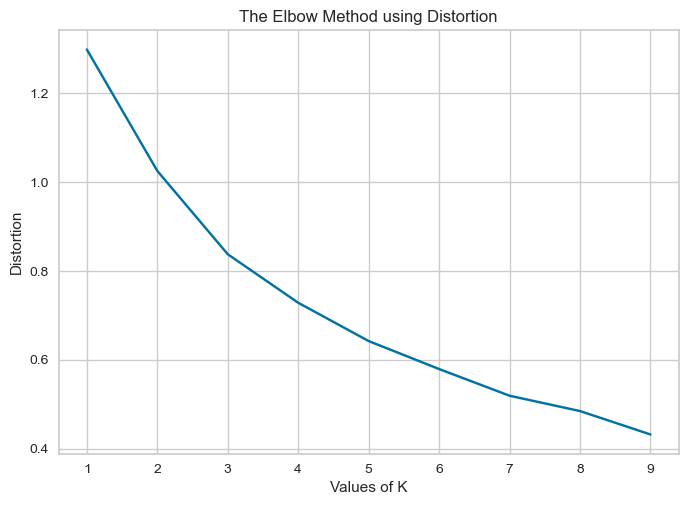

In [45]:
# Using the different values of Distortion:
plt.plot(K, distortions, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Distortion')
plt.title('The Elbow Method using Distortion')
plt.show()

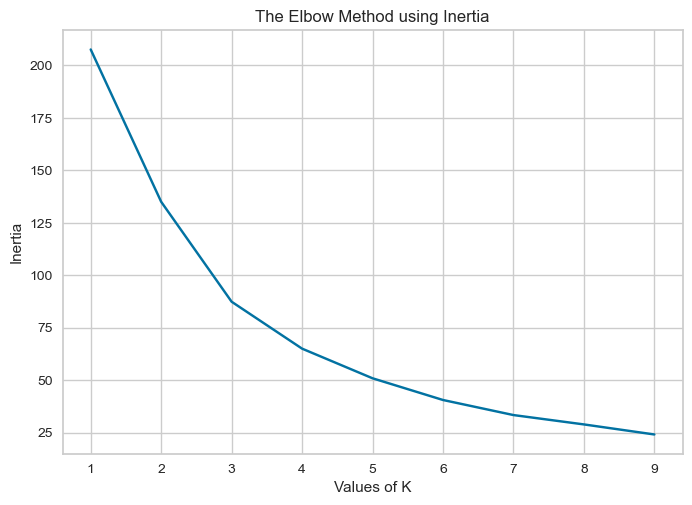

In [46]:
#Using the different values of Inertia:
plt.plot(K, inertias, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Inertia')
plt.title('The Elbow Method using Inertia')
plt.show()

To determine the optimal number of clusters, we have to select the value of k at the “elbow” ie the point after which the distortion/inertia start decreasing in a linear fashion. Thus for the given data, we conclude that the optimal number of clusters for the data is 3.


#### <B>2. Silhouette Score/Method </B>


The silhouette score, s, is given
as

$$s_{i}= b_{i}-a_{i}/max\left\{ a_{i},b_{i} \right\}$$

where $b_i$ is the average distance between observation i and the observations in the nearest cluster, and $a_i$ is the average distance between observation i and all other observations in the same cluster as observation i. Note that if a cluster only has one point in it, we set $s_i$ = 0. $s_i$ will be between -1 and 1, and the higher the better, meaning that the cluster assignment was good. To get a final silhouette score for a particular value of k you can simply take the
average of all of the observations’ silhouette scores (savg), and then choose the value of k with the maximum $s_{avg}$.

In [47]:
score = silhouette_score(X, kmeans.labels_, metric='euclidean')
#
# Print the score
#
print('Silhouette Score: %.3f' % score)

Silhouette Score: 0.338


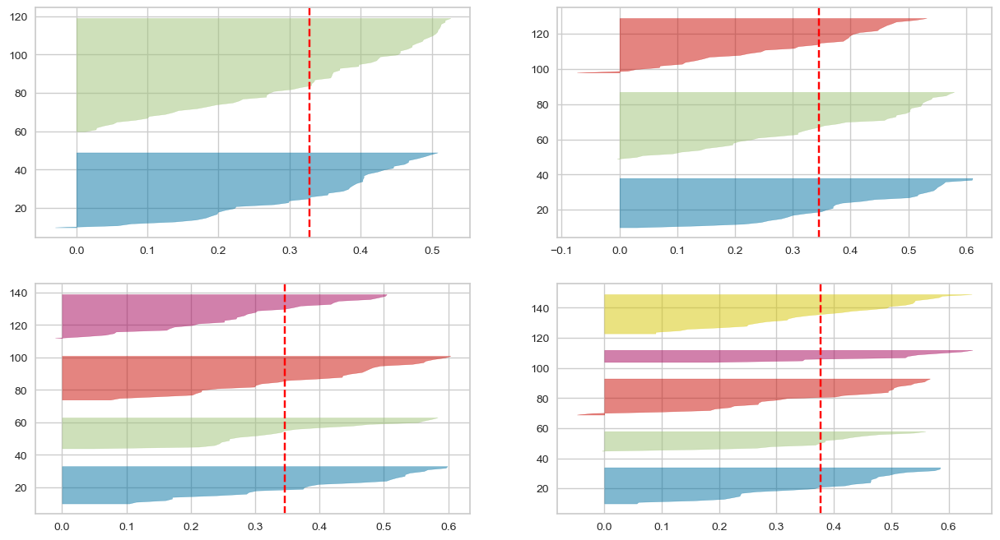

In [48]:
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in [2, 3, 4, 5]:
    '''
    Create KMeans instance for different number of clusters
    '''
    km = KMeans(n_clusters=i, n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(i, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(X)

Visuals with cluster more than 3 shows a Silhouette Score which is greater than 0.344, therefore anyone one of them can be used. The first visual has a Silhouette Score less than 0.344 and can be rejected.

There are few other techniques that also exists to evaluate clustering techniques and some of them are already [implemented in Scikit Learn]():

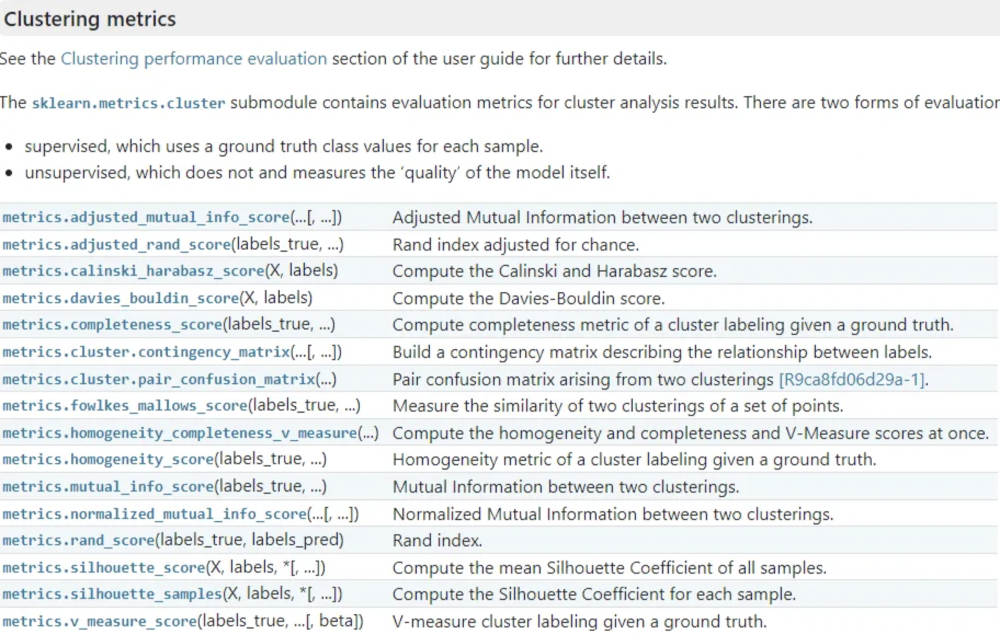

A very detailed analysis of other methodologies can be found [here](https://towardsdatascience.com/are-you-still-using-the-elbow-method-5d271b3063bd).

<b> !!Note </b>

We generally don't break our data into very high number of clusters as an extremely high number of cluster defeats the entire purpose of similarity. Therefore we tend to find the optimal number of clusters using either our domain knowledge or techniques like we discussed above and experiment with the various number of clusters.

#### Other Hyper parameters that are available in Scikit Learn. 


In the numpy implementation we have only considered the most important ones but there are other hyperparameters which are also available let's understand a few of them:

- n_iter or number of iterations: This hyperparameter is the number of iterations of the k-means algorithm for a single run
- random_state or random state: This hyperparameter determines random number generation for centroid initialization. Use an int to make the randomness deterministic.
- n_init: This hyperparameter determines the number of times the k-means algorithm is run with different centroid seeds. The final results is the best output of n_init consecutive runs in terms of inertia

Check the sklearn documentation for more details of other hyperparameters which can also be used but the above three are the most frequently used parameters for K-Means algorithm.

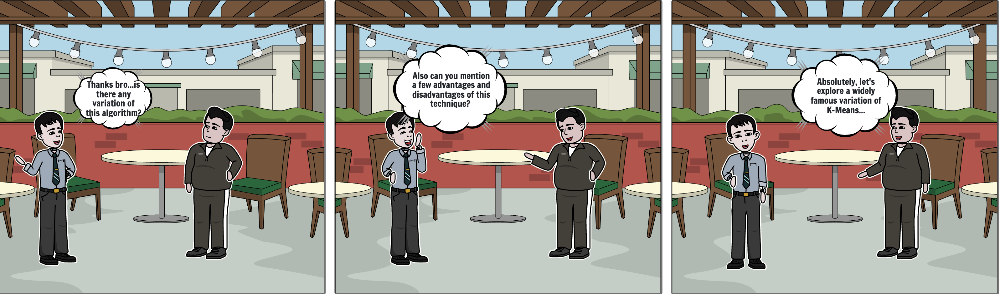

## <B><u> K-Means++</u></B>

K-Means++ is an improvement on the basic K-Means algorithm that addresses the sensitivity to the initial cluster center assignments by selecting the initial cluster centers in a more optimal way. The algorithm starts by selecting the first cluster center randomly from the input points, and then selects each subsequent cluster center based on the distances of the points to their closest cluster center, with a higher probability of selecting points that are farther away. This results in a more optimal initialization of the cluster centers and reduces the likelihood of converging to a local optimum.


The algorithm is as follows:
- first randomly choose a point in X to be the first centroid
- calculate the distance between all points in X and the centroid
- choose the next centroid from the remaining points in X with probability proportional to the distances, i.e. points that are further from the centroids are more likely to be selected as centroids


### [Numpy](https://numpy.org/doc/stable/user/whatisnumpy.html) implementation of K-Means++ Algorithm

In [49]:
class KMeansPlusPlus_custom:
    def __init__(self, n_clusters, max_iter=100, random_state=0):
        self.n_clusters = n_clusters
        self.max_iter = max_iter
        self.random_state = random_state

    def fit(self, X):
        np.random.seed(self.random_state)
        self.cluster_centers_ = np.empty((self.n_clusters, X.shape[1]))
        self.cluster_centers_[0] = X[np.random.choice(X.shape[0])]
        for i in range(1, self.n_clusters):
            distances = np.array([np.min([np.linalg.norm(x - center) for center in self.cluster_centers_[:i]]) for x in X])
            probabilities = distances / distances.sum()
            self.cluster_centers_[i] = X[np.random.choice(X.shape[0], p=probabilities)]
        for _ in range(self.max_iter):
            distances = np.array([np.linalg.norm(X - center, axis=1) for center in self.cluster_centers_])
            closest_cluster = np.argmin(distances, axis=0)
            new_cluster_centers = np.array([X[closest_cluster == c].mean(axis=0) for c in range(self.n_clusters)])
            if np.all(self.cluster_centers_ == new_cluster_centers):
                break
            self.cluster_centers_ = new_cluster_centers

    def predict(self, X):
        distances = np.array([np.linalg.norm(X - center, axis=1) for center in self.cluster_centers_])
        closest_cluster = np.argmin(distances, axis=0)
        return closest_cluster

def visualize_clusters(X, y, centroids, title):
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis')
    plt.scatter(centroids[:, 0], centroids[:, 1], marker='o', s=200, linewidths=3, color='black', zorder=10)
    for i, c in enumerate(centroids):
        plt.scatter(c[0], c[1], marker='${}$'.format(i), s=50, color='black', zorder=10)
    plt.title(title)
    plt.show()


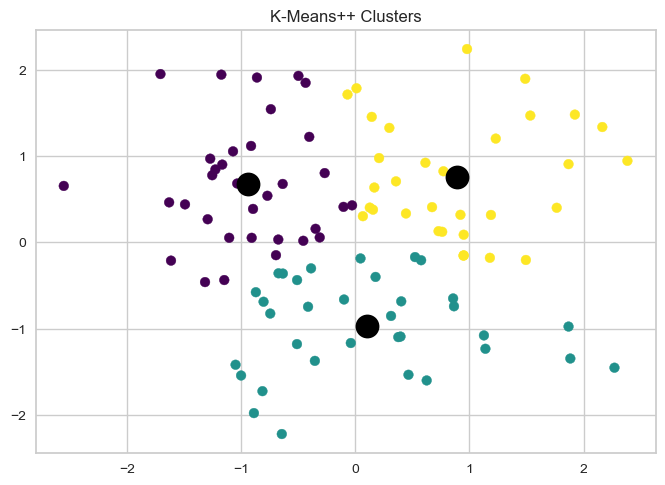

In [50]:
# Fit KMeans to the sample data
kmeans_plus_plus = KMeansPlusPlus_custom(n_clusters=3, random_state=0)
kmeans_plus_plus.fit(X)

# Predict cluster labels for the sample data
y_pred = kmeans_plus_plus.predict(X)

centroids = kmeans_plus_plus.cluster_centers_
# Visualize the clusters
visualize_clusters(X, y_pred,centroids ,'K-Means++ Clusters')

### [Scikit-Learn](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html) implementation

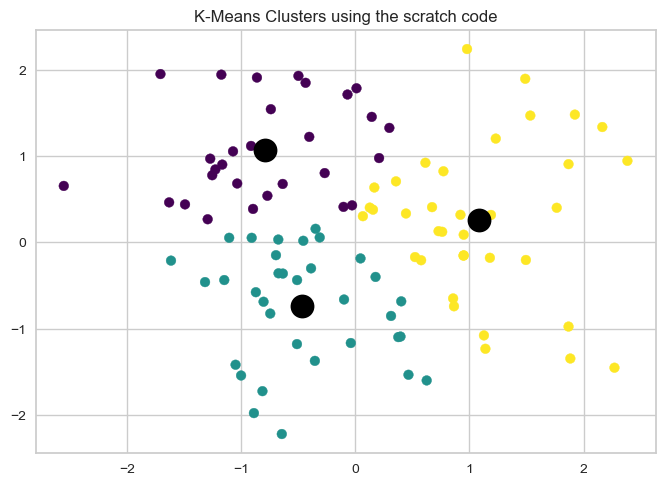

In [51]:
## !! The init method is changed to 
kmeans= KMeans(n_clusters=3, init='k-means++')
kmeans.fit(X)

y_pred = kmeans.predict(X)
cluster_centers = kmeans.cluster_centers_

visualize_clusters(X, y_pred, cluster_centers,'K-Means Clusters using the scratch code')

Advantages of the basic K-Means algorithm include its simplicity and efficiency for large datasets. The algorithm is also easy to understand and can be used for a wide range of clustering tasks. However, one of the main disadvantages of the basic K-Means algorithm is that it is sensitive to the initial cluster center assignments and may converge to a local optimum instead of the global optimum.

Advantages of the K-Means++ algorithm include a more optimal initialization of the cluster centers, which can result in faster convergence and a higher-quality solution. The algorithm is also relatively simple to implement and understand. However, one of the main disadvantages of the K-Means++ algorithm is that it can be computationally expensive for large datasets, since it requires computing the distances between the points and their closest cluster center for each iteration.

In terms of performance, both the basic K-Means and K-Means++ algorithms are efficient for clustering large datasets. However, the K-Means++ algorithm generally performs better in terms of finding the global optimum solution due to its more optimal initialization of the cluster centers. The choice of which algorithm to use may depend on the specific clustering task and the size and characteristics of the dataset.

K-Means and K-Means++ often are used as benchmark for many more types of technique. Some of which are:

1. Gaussian Mixture Models (GMM): K-Means can be used as an initialization step for GMMs, which model a dataset as a mixture of Gaussian distributions. The cluster centers obtained from K-Means are used as the initial means of the Gaussian distributions, and the algorithm is then fine-tuned to estimate the covariance matrices and mixture weights.

2. Hierarchical Clustering: K-Means can also be used as a step in hierarchical clustering, where the algorithm is used to partition the data into multiple levels of clusters. The cluster centers from one level are used as input points for the next level, and the process is repeated until the desired number of clusters is reached.

3. Density-Based Clustering: K-Means and K-Means++ can be used as preprocessing steps for density-based clustering algorithms, such as DBSCAN. The algorithm first uses K-Means or K-Means++ to find the cluster centers, and then uses these centers to estimate the density of the data. Points that are in high-density regions are considered as part of the same cluster, while points in low-density regions are considered as noise or outliers.

4. Anomaly Detection: K-Means and K-Means++ can also be used for anomaly detection by fitting a model to the normal data and using it to identify points that deviate significantly from the normal behavior. The algorithm first uses K-Means or K-Means++ to cluster the normal data into k clusters, and then calculates the distances of the remaining points to the cluster centers. Points that are far from the cluster centers are considered as anomalies.

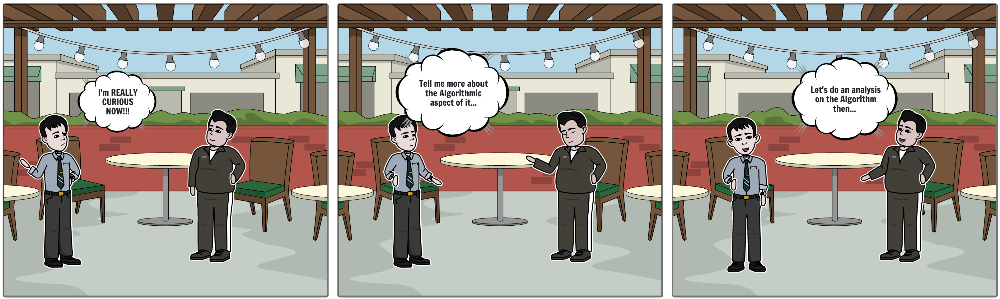

The time and space complexity of the K-Means and K-Means++ algorithm depends on several factors such as the number of data points, the number of clusters, and the number of iterations required for convergence. Here are the typical time and space complexities of the K-Means and K-Means++ algorithm:    
    

##### <u>Time and Space Complexity for K-Means</u>
    
Time Complexity:

The K-Means algorithm is an iterative algorithm that updates the centroids of the clusters until convergence. The time complexity of the algorithm is O(knI), where k is the number of clusters, n is the number of data points, and I is the number of iterations required for convergence.
The time complexity of the algorithm can be improved by using optimization techniques such as the triangle inequality or by using more efficient data structures to speed up the nearest-neighbor search for assigning data points to clusters.

Space Complexity:

The space complexity of the K-Means algorithm is O(kn), as it requires storing all the data points and the centroids of the clusters. Additionally, the algorithm requires some extra space for storing temporary variables and intermediate results during the computations.
    
In summary, the K-Means algorithm has a time complexity of O(knI) and a space complexity of O(kn), where k is the number of clusters, n is the number of data points, and I is the number of iterations required for convergence. The time complexity can be improved using optimization techniques, but the space complexity remains the same.


##### <u>Time and Space Complexity for K-Means++</u>


Time Complexity:

The initialization phase of K-Means++ algorithm takes O(kn) time, where k is the number of clusters and n is the number of data points.

However, the K-Means++ algorithm usually requires fewer iterations than the standard K-Means algorithm because the initialization of the cluster centers is more optimal and may require less iterations to converge. As a result, the overall time complexity of the K-Means++ algorithm is generally lower than the basic K-Means algorithm. It has been shown that it is 0(log K)-competive. More about this can be found [here](http://ilpubs.stanford.edu:8090/778/1/2006-13.pdf). of  which leads to a lower time complexity. The exact number of iterations depends on the data distribution and the initialization.
    
Overall, the time complexity of the K-Means++ algorithm is typically between O(kn) and O(knI), depending on the initialization and convergence speed.

Space Complexity:

The space complexity of the K-Means++ algorithm is O(kn), as it requires storing all the data points and the centroids of the clusters. Additionally, the algorithm requires some extra space for storing temporary variables and intermediate results during the computations.
In summary, the K-Means++ algorithm has a time complexity of between O(kn) and O(knI) and a space complexity of O(kn), where k is the number of clusters, n is the number of data points, and I is the number of iterations required for convergence.


##### Before moving to the other algorithms and use cases one very important question that remains un-answered is, how do you determine the quality of your cluster??


The direct answer is 'Domain Knowledge', i.e., you are aware of the number of clusters that can be formed and what is the unique characteristic of these individual clusters. But if we don't have domain knowledge there are some mathematical techniques which we can implement to understand the quality of our clusters. They are majorly two types of measures to assess the clustering performance:

1. Extrinsic Measures,i.e., which require ground truth labels. Examples are Adjusted Rand index, Fowlkes-Mallows scores, Mutual information based scores, Homogeneity, Completeness and V-measure.

2. Intrinsic Measures,i.e., that does not require ground truth labels. Some of the clustering performance measures are Silhouette Coefficient, Calinski-Harabasz Index,Dunn's Index ,Davies-Bouldin Index etc.

Let's explore two popular extrensic measures;

The <u>Adjusted Rand Index</u> is a measure of the similarity between the clustering solution and the ground truth labels, adjusted for chance. It computes the proportion of pairs of data points that are assigned to the same cluster in both the clustering solution and the ground truth labels, taking into account the possibility of random agreement. The ARI ranges from -1 to 1, with 1 indicating perfect agreement and 0 indicating random agreement.

The <u>Fowlkes-Mallows score</u> is a measure of the similarity between the clustering solution and the ground truth labels that combines precision and recall. It computes the geometric mean of the precision and recall of the clustering solution with respect to the ground truth labels. The FM score ranges from 0 to 1, with 1 indicating perfect agreement and 0 indicating no agreement.

Since we have looked into Silhouette Coefficient in details, let's explore two other intrinsic measures;

The <u>Calinski-Harabasz Index (CHI)</u> is a measure of the ratio of the between-cluster variance to the within-cluster variance, also known as the inter-cluster to intra-cluster distance ratio. It aims to find a clustering solution that maximizes the distance between the clusters and minimizes the distance within the clusters, which is an indication of compactness. A higher CHI score indicates a better clustering solution. However, CHI tends to favor solutions with more clusters, which may not always be desirable.

<u>Dunn's Index</u> is a measure of the ratio of the minimum distance between clusters to the maximum diameter of the clusters. It aims to find a clustering solution that maximizes the minimum distance between clusters while minimizing the maximum diameter of the clusters. Therefore, it evaluates the compactness and separation of the clusters, which are internal characteristics of the clustering solution. A higher Dunn's Index score indicates a better clustering solution.


<b>!! Note </b> 
There is no one fixed evaluation metric that we can use for all use cases, there is no free lunch, but we generally use a combination of intrinsic, extrensic measures along with domain knowledge to determine the quality of our clusters.

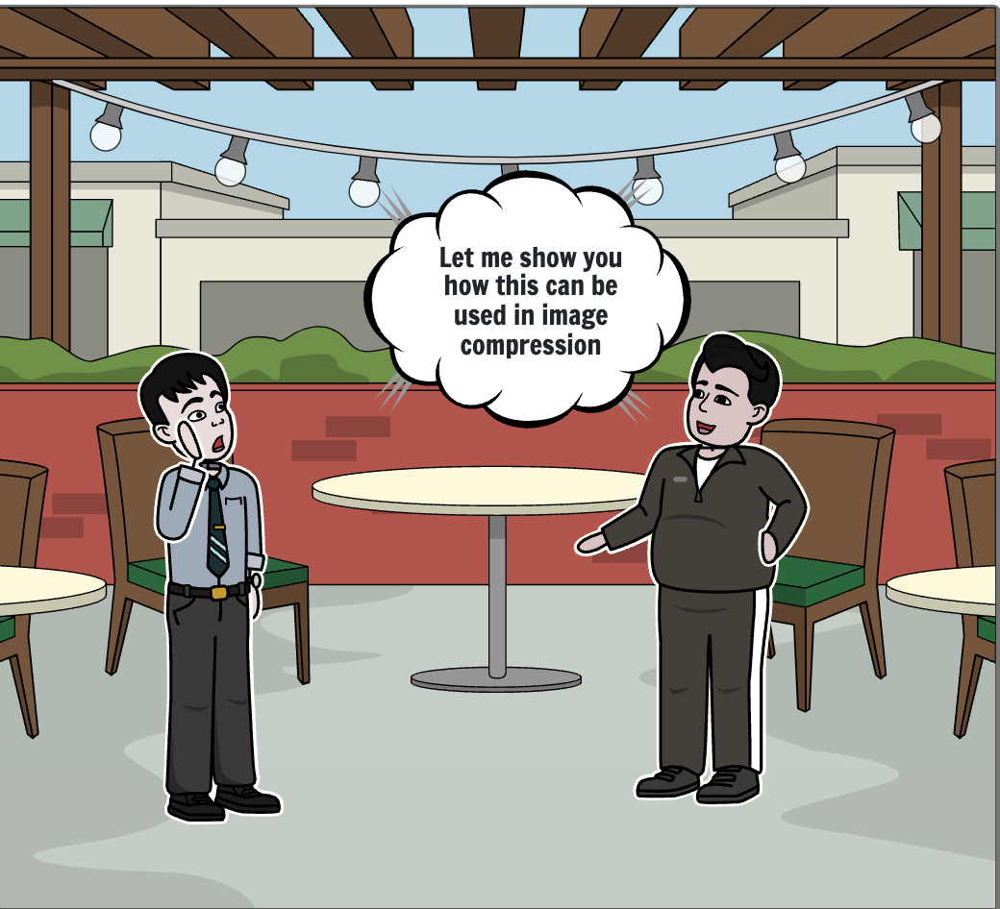

## Vector Quantization

In this example we will use k-means to do something called vector quantization, which is just a way of saying that we will take a vector and bin it into a specified $k$ number of bins where the bins are defined using the k-means algorithm. This is a way of compressing data. For this, we can use an image as our data, where the image itself is a 1024 x 768 grid of pixels with a grayscale value. We can transform this image into a vector, do the k-means on the vector, assign each pixel (the color of the pixel) to its cluster center, thereby compressing the image, and then plot the resulting image to see how the pixels change depending on which cluster it was assigned to.

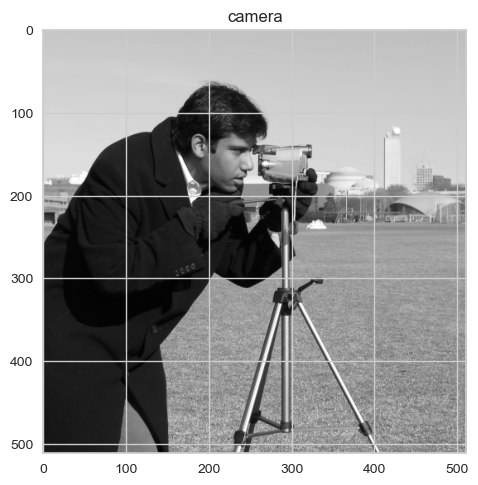

In [52]:
from skimage import data #image library from sklearn family

caller = getattr(data, 'camera')
image = caller()
plt.figure()
plt.title('camera')
if image.ndim == 2:
    plt.imshow(image, cmap=plt.cm.gray)
else:
    plt.imshow(image)

plt.show()

In [53]:
n_clusters = 2
np.random.seed(0)

X = image.reshape((-1, 1))  
X.shape

(262144, 1)

Notice that we reshaped the image to be a column vector, and we chose $k=5$ above with `n_clusters`. Now below, fit the k-means algorithm to find the five cluster centroids, then let's extract those centroid values, and then for each pixel let's see which centroid the pixel was assigned to. 

In [54]:
k_means = KMeans(n_clusters=n_clusters, n_init=4)
k_means.fit(X)
values = k_means.cluster_centers_.squeeze()
labels = k_means.labels_

Next, so we can plot the image with the new grayscale color, which is just the centroid of the cluster that each pixel was assigned to, let's recreate the array with the new pixel values in it.

In [55]:
image_compressed = np.choose(labels, values)
image_compressed.shape = image.shape
image_compressed.shape

(512, 512)

Now we can plot both the uncompressed image, and the compressed image below and compare. Do this again where you reduce `n_clusters` to smaller value and then a higher value and see how the compressed image changes with each choice. We also look at a histogram of the pixel values along with the bins that were created by the clustering algorithm.

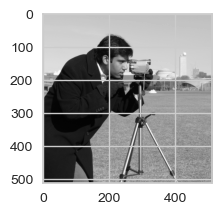

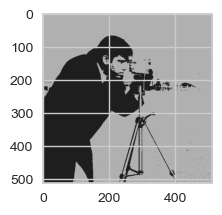

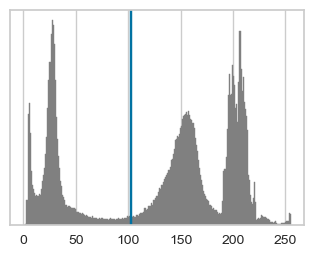

In [56]:
vmin = image.min()
vmax = image.max()

# original face
plt.figure(1, figsize=(3, 2.2))
plt.imshow(image, cmap=plt.cm.gray, vmin=vmin, vmax=256)

# compressed face
plt.figure(2, figsize=(3, 2.2))
plt.imshow(image_compressed, cmap=plt.cm.gray, vmin=vmin, vmax=vmax)


# histogram
plt.figure(4, figsize=(3, 2.2))
plt.clf()
plt.axes([0.01, 0.01, 0.98, 0.98])
plt.hist(X, bins=256, color=".5", edgecolor=".5")
plt.yticks(())
plt.xticks()
values = np.sort(values)
for center_1, center_2 in zip(values[:-1], values[1:]):
    plt.axvline(0.5 * (center_1 + center_2), color="b")

plt.show()

## Color Image Quanitization

Let's do the same as above, but on a color image instead.

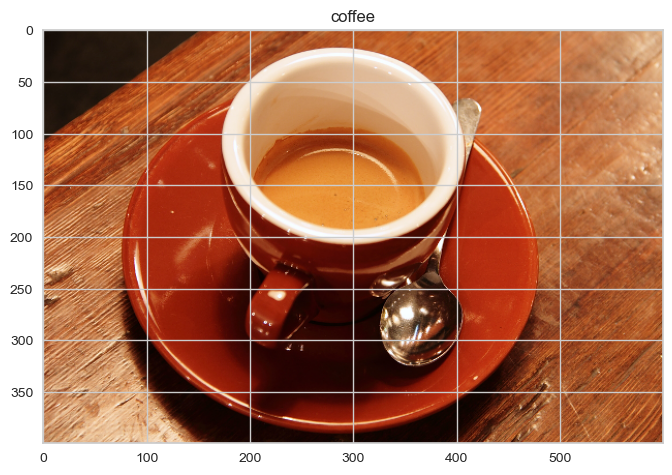

(400, 600, 3)

In [57]:
caller = getattr(data, 'coffee')
image = caller()
plt.figure()
plt.title('coffee')
if image.ndim == 2:
    plt.imshow(image, cmap=plt.cm.gray)
else:
    plt.imshow(image)

plt.show()

flower = np.array(image, dtype=np.float64) / 255
flower.shape

Notice the shape of the image array. This is common for color images to be a 3-dimensional array, where the first two dimensions identify the row and column (the location of the pixel) and the third dimension identifies the RGB (red, green, blue) value, which defines the color of the pixel. As before, we will need to reshape this into a 2-dimensional array to do the clustering. The new shape should be number of pixels x 3.

In [58]:
# Load Image and transform to a 2D numpy array.
w, h, d = original_shape = tuple(flower.shape)

image_array = np.reshape(flower, (w * h, d))
image_array.shape

(240000, 3)

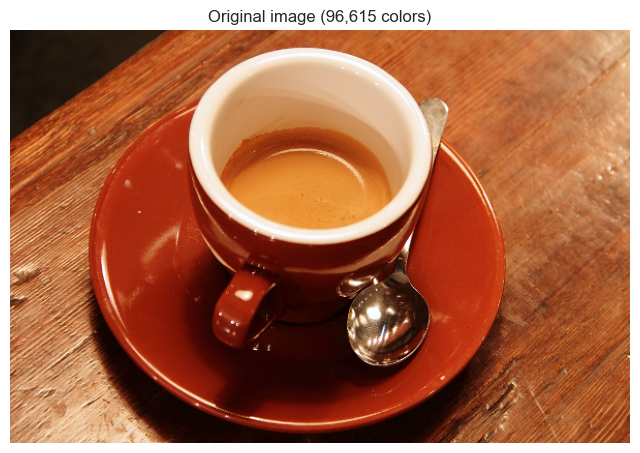

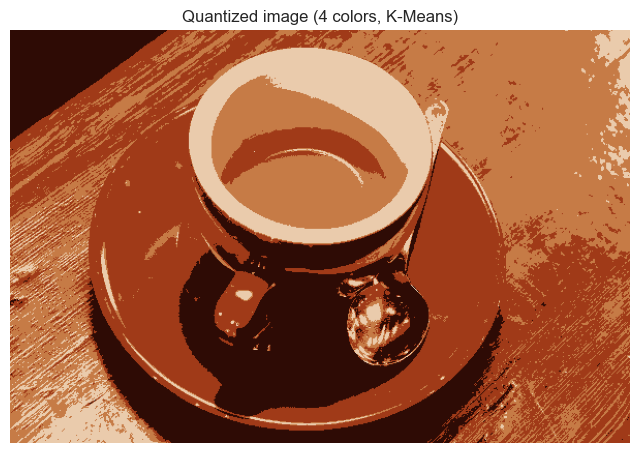

In [59]:
n_colors = 4

image_array_sample = shuffle(image_array, random_state=0, n_samples=1_000)
kmeans = KMeans(n_clusters=n_colors, random_state=0).fit(image_array_sample)

# Get labels for all points
labels = kmeans.predict(image_array)

def recreate_image(codebook, labels, w, h):
    """Recreate the (compressed) image from the code book & labels"""
    return codebook[labels].reshape(w, h, -1)


# Display all results, alongside original image
plt.figure(1)
plt.clf()
plt.axis("off")
plt.title("Original image (96,615 colors)")
plt.imshow(flower)

plt.figure(2)
plt.clf()
plt.axis("off")
plt.title(f"Quantized image ({n_colors} colors, K-Means)")
plt.imshow(recreate_image(kmeans.cluster_centers_, labels, w, h))

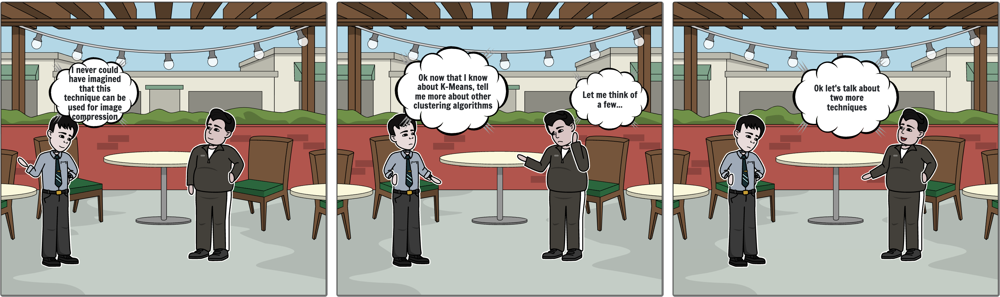

## Fuzzy C-Means

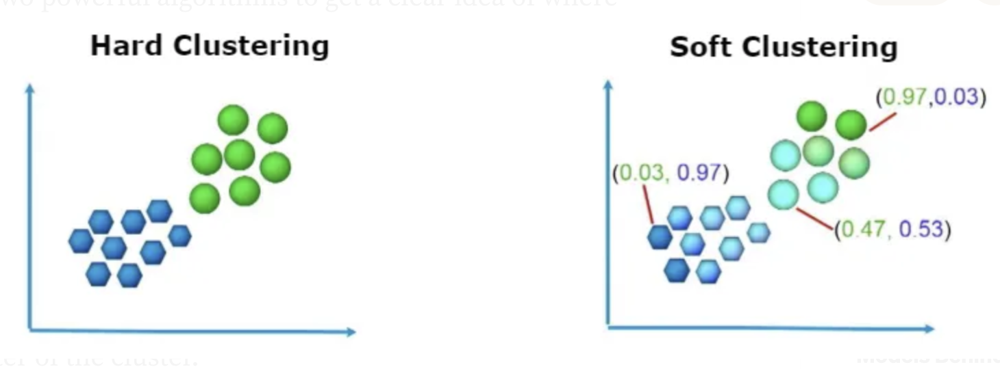

So, “fuzzy” here means “not sure”, which indicates that it’s a soft clustering method. “C-means” means c cluster centers, which only replaces the “K” in “K-means” with a “C” to make it look different.

In a clustering algorithm, if the probability of one data point belonging to a cluster can only take the value of 1 or 0, it’s hard clustering. The boundary of a cluster in a hard clustering method can be visualized as a crisp boundary. On the contrary, in a soft clustering method, the probability of one data point belonging to a cluster can take any value between 0 and 1, such as 75%, for which the boundary of a cluster can be visualized as a fuzzy boundary.

In the Fuzzy c-means (FCM) clustering method, we have two parameters, $μ_{ij}$ and $c_i$, and one hyperparameter, m.
$μ_{ij}$ , membership value, is the probability that the jth data point belongs to the ith cluster, and it is constrained to that the sum of $μ_{ij}$ over C cluster centers is 1 for every data point j. $c_i$ is the center of the ith cluster (the same dimension with X). And m is the fuzzifier, which controls how fuzzy the cluster boundary should be.


$$J= \sum_{i=1}^{C}\sum_{j=1}^{N}\mu^{m}_{ij}||x_{j}-c_{i}||^{2}$$


Remember we want to minimize the objective function, so it’s good to have small μs for those long distances (between data points and cluster centers).

Therefore, for a very large m, the cluster centers tend to locate at a place with nearly equal distance to all the data points because every point’s distance to centers contributes equally small to the objective function. So, where are the cluster centers? Yes, the center of all the data points.

If m is super large, with all cluster centers located at the centroid of all data points, the clustering will be super “fuzzy” because it doesn’t cluster at all! So  the real question is how do we find the parameters $c_i$ and $\mu_{ij}$??

We can solve them using a Lagrangian function but the final form that we have to optimize are given with the algorithm which is as follows:




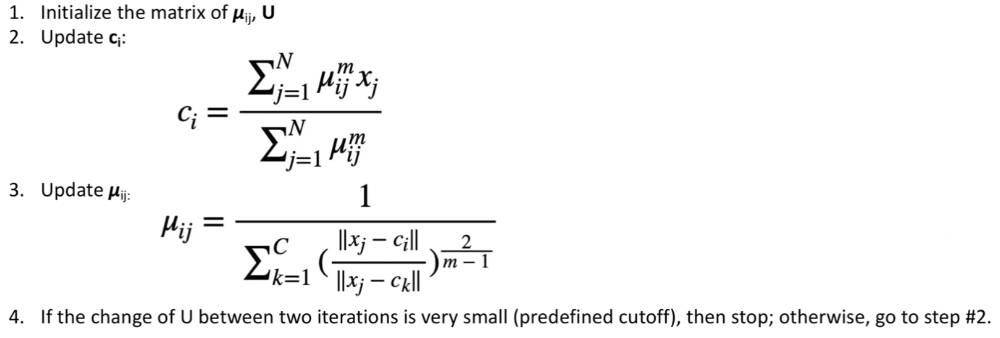


It is very similar to the EM algorithm(Expectation–maximization algorithm). Below is the implementation from scratch using the implementation of Wensheng Sun as an inspiration. Fore more curious folks, here is a good [documentation](https://medium.com/geekculture/fuzzy-c-means-clustering-fcm-algorithm-in-machine-learning-c2e51e586fff) to know more about it

##### Below is the numpy implementation of the algorithm

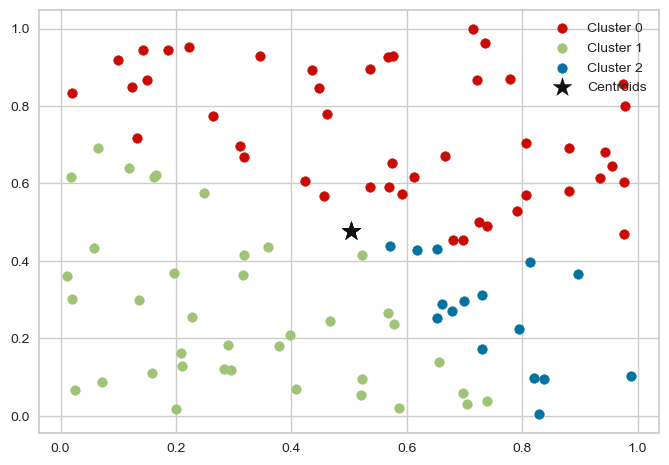

In [60]:
import numpy as np
import matplotlib.pyplot as plt

# Define the Fuzzy C-means function
def fuzzy_cmeans(X, num_clusters, m=2, max_iter=100, tol=1e-4):
    # Initialize the membership matrix randomly
    N, D = X.shape
    U = np.random.rand(N, num_clusters)
    U /= np.sum(U, axis=1, keepdims=True)
    
    # Iterate until convergence or maximum number of iterations
    for i in range(max_iter):
        # Compute the cluster centroids
        centroids = np.dot(U.T, X) / np.sum(U, axis=0, keepdims=True).T
        
        # Compute the membership matrix
        distances = np.linalg.norm(X[:, np.newaxis, :] - centroids, axis=2)
        membership_mat = 1 / (1 + (distances / np.expand_dims(np.min(distances, axis=1), axis=1)) ** (2/(m-1)))
        
        # Check for convergence
        if np.linalg.norm(membership_mat - U) < tol:
            break
            
        U = membership_mat
    
    return membership_mat, centroids

# Generate random data
X = np.random.rand(100, 2)

# Cluster the data
num_clusters = 3
membership_mat, centroids = fuzzy_cmeans(X, num_clusters)

# Plot the data points
colors = ['r', 'g', 'b', 'c', 'm', 'y', 'k']
for i in range(num_clusters):
    indices = np.where(membership_mat[:, i] == np.max(membership_mat, axis=1))[0]
    plt.scatter(X[indices, 0], X[indices, 1], c=colors[i], label=f'Cluster {i}')


# Plot the cluster centroids
plt.scatter(centroids[:, 0], centroids[:, 1], s=200, c='k', marker='*', label='Centroids')

plt.legend()
plt.show()




##### Implementing Fuzzy C means using the [Fuzzy-c-means](https://github.com/omadson/fuzzy-c-means) library 

In [61]:
from fcmeans import FCM

my_model = FCM(n_clusters=3) # we use two cluster as an example
my_model.fit(X) ## X, numpy array. rows:samples columns:features

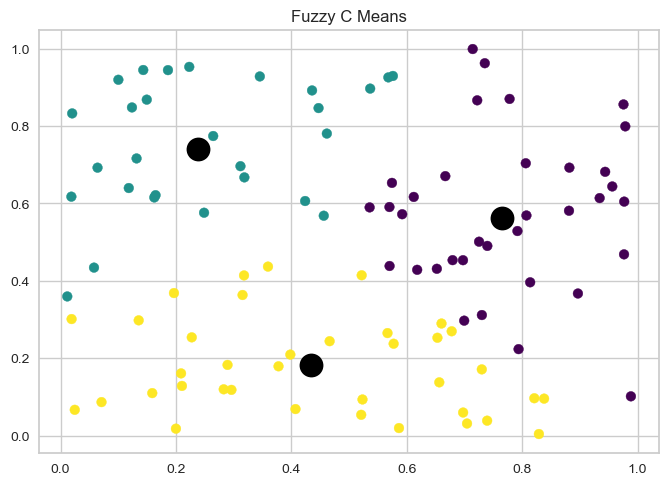

In [62]:
# Predict cluster labels for the sample data
y_pred = my_model.predict(X)
cluster_centers = my_model.centers

# Visualize the clusters
visualize_clusters(X, y_pred,cluster_centers ,'Fuzzy C Means')

##### Let's consider the algorithmic aspect of this algorithm and think of the space and time complexity of Fuzzy C-means

Time complexity:

1. Computing the distance matrix: O(n^2d), where n is the number of data points and d is the dimensionality of the data
2. Updating the cluster centroids: O(knd), where k is the number of clusters
3. Updating the membership values: O(kn)
4. Checking convergence: O(p), where p is the number of iterations required for convergence
Therefore, the overall time complexity of FCM can be expressed as O(p(knd + kn + n^2d)), or more simply as O(pknd), where p is the number of iterations required for convergence.

Space complexity:

1. Storing the distance matrix: O(n^2)
2. Storing the membership values: O(kn)
3. Storing the cluster centroids: O(kd)
Therefore, the overall space complexity of FCM can be expressed as O(n^2 + kn + kd).

The time and space complexity of FCM can be quite high for large data sets and/or a large number of clusters. Various modifications and improvements have been proposed to reduce the computational cost of FCM, such as using subsampling or parallelization.

## Spectral Clustering

Spectral clustering is a technique with roots in graph theory, where the approach is used to identify communities of nodes in a graph based on the edges connecting them. The method is flexible and allows us to cluster non graph data as well. Spectral clustering uses information from the eigenvalues (spectrum) of special matrices built from the graph or the data set. We’ll learn how to construct these matrices, interpret their spectrum, and use the eigenvectors to assign our data to clusters.

Before jumping head first into the nitty gritties of this technique let's define the following terms which are the basic concepts on which spectral clustering is built:

- Eigenvectors and Eigenvalues: 
For a matrix A, if there exists a vector x which isn’t all 0’s and a scalar λ such that Ax = λx, then x is said to be an eigenvector of A with corresponding eigenvalue λ.

- Graphs
Graphs are a natural way to represent many types of data. A graph is a set of nodes with a corresponding set of edges which connect the nodes. The edges may be directed or undirected and can even have weights associated with them.

- Adjacency Matrix
We can represent our example graph as an adjacency matrix, where the row and column indices represent the nodes, and the entries represent the absence or presence of an edge between the nodes.

    In this matric we  see how the rows and columns are connected, i.e.,if, row 0, column 1 has a value of 1. That means that there is an edge connecting node 0 with node 1. If the edges were weighted, the weights of the edges would go in this matrix instead of just 1s and 0s. Since our graph is undirected, the entries for row i, col j will be equal to the entry at row j, col i. The last thing to notice is that the diagonal of this matrix is all 0, since none of our nodes have edges to themselves. We will see an example of this matrix in the following cell blocks.

- Degree Matrix
The degree matrix is a diagonal matrix where the value at entry (i, i) is the degree of node i. The degree of a node is how many edges connect to it. In a directed graph we could talk about in-degree and out-degree.

- Graph Laplacian
 The Laplacian is just another matrix representation of a graph. It has several beautiful properties, which we will take advantage of for spectral clustering. To calculate the normal Laplacian (there are several variants), we just subtract the adjacency matrix from our degree matrix. Laplacian’s diagonal is the degree of our nodes, and the off diagonal is the negative edge weights. This is the representation we are after for performing spectral clustering.
 
Below is the algorithm to implement Spectral Clustering:

- Given a dataset X of n data points
- Define a similarity matrix W using an appropriate similarity measure (e.g. Gaussian kernel or k-nearest neighbors).
- Define a degree matrix D where D_ii is the sum of the weights in row i of W.
- Compute the Laplacian matrix L = D - W.
- Compute the k smallest eigenvectors (corresponding to the k smallest eigenvalues) of L using eigenvalue decomposition.
- Form a matrix U by stacking the k eigenvectors in columns.
- Normalize the rows of U to have unit length.
- Cluster the normalized rows of U using k-means or any other clustering algorithm.
- Assign each data point in X to the cluster with the closest centroid.

In [63]:
## Adjacency Matrix

A = np.array([
  [0, 1, 1, 0, 0, 0, 0, 0, 1, 1],
  [1, 0, 1, 0, 0, 0, 0, 0, 0, 0],
  [1, 1, 0, 0, 0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 1, 1, 0, 0, 0, 0],
  [0, 0, 0, 1, 0, 1, 0, 0, 0, 0],
  [0, 0, 0, 1, 1, 0, 1, 1, 0, 0],
  [0, 0, 0, 0, 0, 1, 0, 1, 0, 0],
  [0, 0, 0, 0, 0, 1, 1, 0, 0, 0],
  [1, 0, 0, 0, 0, 0, 0, 0, 0, 1],
  [1, 0, 0, 0, 0, 0, 0, 0, 1, 0]])

print(A)

[[0 1 1 0 0 0 0 0 1 1]
 [1 0 1 0 0 0 0 0 0 0]
 [1 1 0 0 0 0 0 0 0 0]
 [0 0 0 0 1 1 0 0 0 0]
 [0 0 0 1 0 1 0 0 0 0]
 [0 0 0 1 1 0 1 1 0 0]
 [0 0 0 0 0 1 0 1 0 0]
 [0 0 0 0 0 1 1 0 0 0]
 [1 0 0 0 0 0 0 0 0 1]
 [1 0 0 0 0 0 0 0 1 0]]


In [64]:
## Degree Matrix
D = np.diag(A.sum(axis=1))
print(D)

[[4 0 0 0 0 0 0 0 0 0]
 [0 2 0 0 0 0 0 0 0 0]
 [0 0 2 0 0 0 0 0 0 0]
 [0 0 0 2 0 0 0 0 0 0]
 [0 0 0 0 2 0 0 0 0 0]
 [0 0 0 0 0 4 0 0 0 0]
 [0 0 0 0 0 0 2 0 0 0]
 [0 0 0 0 0 0 0 2 0 0]
 [0 0 0 0 0 0 0 0 2 0]
 [0 0 0 0 0 0 0 0 0 2]]


In [65]:
## Graph Laplacian
L = D-A
print(L)

[[ 4 -1 -1  0  0  0  0  0 -1 -1]
 [-1  2 -1  0  0  0  0  0  0  0]
 [-1 -1  2  0  0  0  0  0  0  0]
 [ 0  0  0  2 -1 -1  0  0  0  0]
 [ 0  0  0 -1  2 -1  0  0  0  0]
 [ 0  0  0 -1 -1  4 -1 -1  0  0]
 [ 0  0  0  0  0 -1  2 -1  0  0]
 [ 0  0  0  0  0 -1 -1  2  0  0]
 [-1  0  0  0  0  0  0  0  2 -1]
 [-1  0  0  0  0  0  0  0 -1  2]]


## Eigenvalues of Graph Laplacian

The Laplacian has some very interesting and beautiful properties as we mentioned above. Let's try to visualize the most interesting property of this:

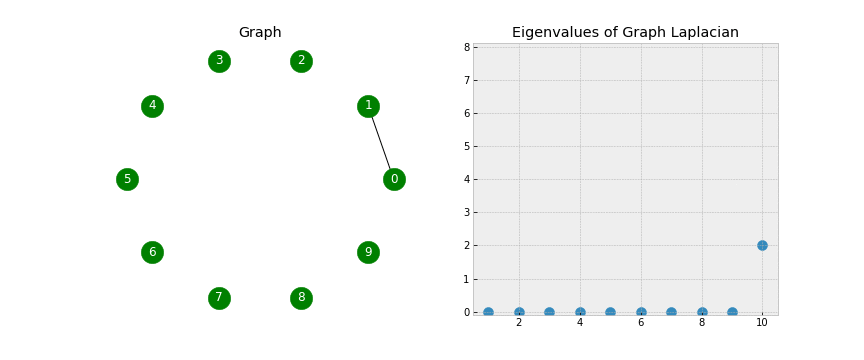

We see that when the graph is completely disconnected initially, then all ten of our eigenvalues are 0. As we continue adding edges, some of our eigenvalues increase. In fact, the number of 0 eigenvalues corresponds to the number of connected components in our graph!
Let's take a special focus when the final edge is added, connecting the two components into one. When this happens, all of the eigenvalues but one have been lifted.

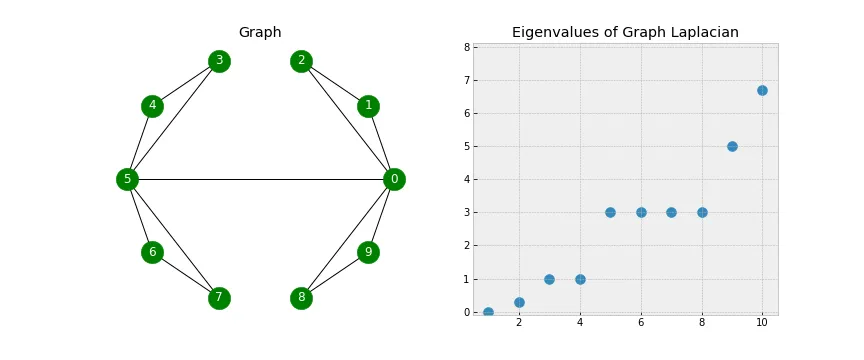

The first eigenvalue is always 0 beause there is only one connected component, the first non zero eigen value is called the spectral gap, it gives us a notion of density of the graph. The second eigenvalue is called the Fiedler value, and the corresponding vector is the Fiedler vector. The Fiedler value approximates the minimum graph cut needed to separate the graph into two connected components. Each value in the Fiedler vector gives us information about which side of the cut that node belongs.

### Numpy implementation

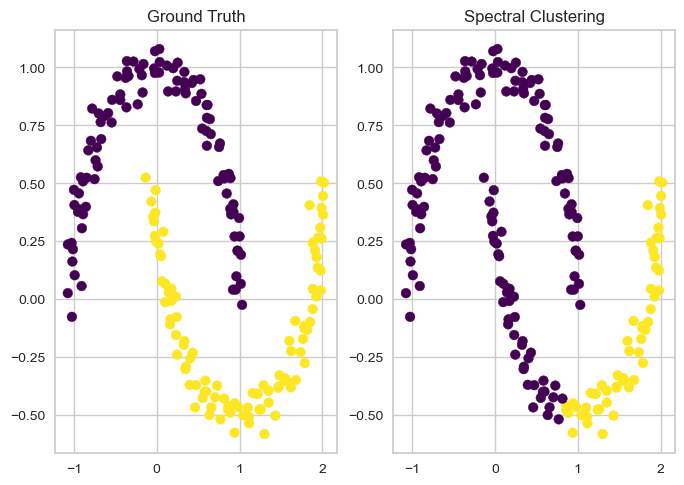

In [66]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons

# Generate moons dataset
X, y = make_moons(n_samples=200, noise=0.05, random_state=0)


# Calculate affinity matrix using RBF kernel
def rbf_kernel(X, gamma):
    pairwise_dists = np.square(np.linalg.norm(X[:, np.newaxis] - X, axis=2))
    return np.exp(-gamma * pairwise_dists)

affinity = rbf_kernel(X, gamma=10)

# Degree matrix
D = np.diag(affinity.sum(axis=1))

# Laplacian matrix
L = D - affinity

# Eigendecomposition of Laplacian matrix
eigenvals, eigenvects = np.linalg.eigh(L)

# Sort eigenvalues and eigenvectors
idx = eigenvals.argsort()
eigenvals = eigenvals[idx]
eigenvects = eigenvects[:, idx]

# Use k-means to cluster the data based on the eigenvectors
k = 2
U = eigenvects[:, 1:k+1]
kmeans = KMeans(n_clusters=k)
kmeans.fit(U)
labels = kmeans.labels_

# Set default colormap to 'viridis'
plt.rcParams['image.cmap'] = 'viridis'

# Plot the results
plt.subplot(121)
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title("Ground Truth")
plt.subplot(122)
plt.scatter(X[:, 0], X[:, 1], c=labels)
plt.title("Spectral Clustering")
plt.show()


### Scikit-learn implementation

In this example, we generate data with non-spherical clusters using the make_moons function. We then run Spectral Clustering with two clusters on this data using the SpectralClustering class from scikit-learn. We can see that Spectral Clustering correctly clusters the data in this case, and we can evaluate its performance using the Adjusted Rand Index.

I hope these examples help to illustrate the potential limitations of these clustering algorithms in certain situations.

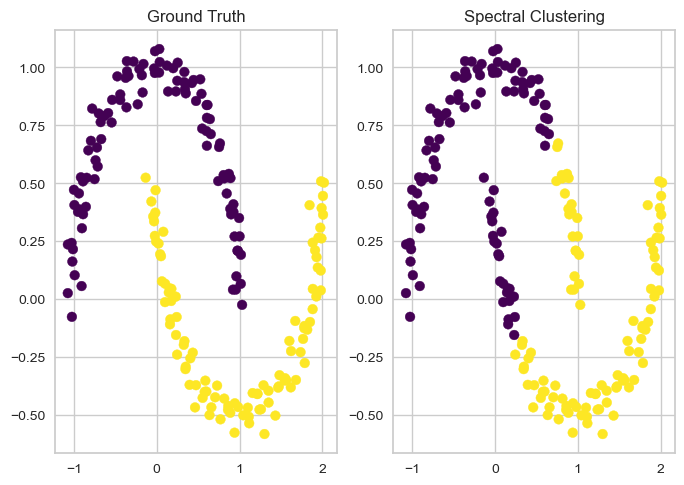

ARI: 0.2667151515151515


In [67]:
# Generate data with non-spherical clusters
# X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

# Run Spectral Clustering with two clusters
sc = SpectralClustering(n_clusters=2, assign_labels='kmeans', random_state=0, affinity = 'rbf').fit(X)

# Visualize the results
plt.subplot(121)
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title("Ground Truth")
plt.subplot(122)
plt.scatter(X[:, 0], X[:, 1], c=sc.labels_)
plt.title("Spectral Clustering")
plt.show()

# Evaluate the performance using Adjusted Rand Index
ari = adjusted_rand_score(y, sc.labels_)
print('ARI:', ari)

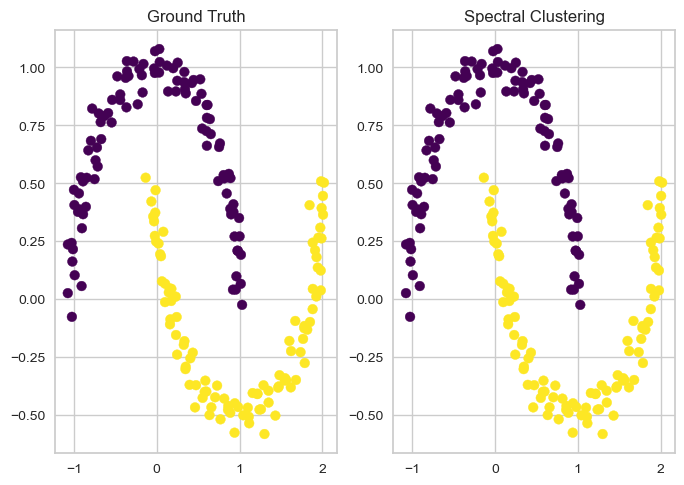

ARI: 1.0


In [68]:
# Generate data with non-spherical clusters
# X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

# Run Spectral Clustering with two clusters
sc = SpectralClustering(n_clusters=2, assign_labels='kmeans', random_state=0, affinity = 'nearest_neighbors').fit(X)

# Visualize the results
plt.subplot(121)
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title("Ground Truth")
plt.subplot(122)
plt.scatter(X[:, 0], X[:, 1], c=sc.labels_)
plt.title("Spectral Clustering")
plt.show()

# Evaluate the performance using Adjusted Rand Index
ari = adjusted_rand_score(y, sc.labels_)
print('ARI:', ari)

#### !! See the stark difference in clusters when using the affinity as 'rbf' and 'nearest_neigbors' and the different rand scores as well. Let's understand what these mean:

<b>Radial Basis Function(RBF)</b> kernel and <b>affinity matrix</b> are two different ways to measure the similarity between pairs of points in a dataset.

The RBF kernel is a type of kernel function used in machine learning algorithms that measures the similarity between two data points in a high-dimensional feature space. It is a parametric function that measures the distance between two data points in the feature space using a Gaussian distribution. The RBF kernel is commonly used in spectral clustering algorithms to measure the pairwise similarity between data points, which is used to construct the affinity matrix.

On the other hand, the affinity matrix is a matrix that represents the pairwise similarity between all data points in a dataset. Unlike the RBF kernel, the affinity matrix can be constructed using different similarity measures, such as Euclidean distance, cosine similarity, or correlation coefficient. The affinity matrix can be used directly in spectral clustering algorithms, where it defines the graph structure of the data points.

In spectral clustering, both the RBF kernel and affinity matrix can be used to define the pairwise similarity between data points. The choice of similarity measure depends on the properties of the dataset and the performance of the algorithm. In practice, it's common to try different similarity measures and choose the one that results in the best clustering performance.

##### Let's consider the algorithmic aspect of this algorithm and think of the space and time complexity of Spectral Clustering

Time complexity:

1. Building the similarity matrix: O(n^2), where n is the number of data point
2. Computing the eigenvalues and eigenvectors: O(n^3) for the standard eigenvalue decomposition (EVD) and O(n^2.376) for the faster randomized EVD algorithms
3. Constructing the cluster assignment matrix: O(kn), where k is the number of clusters
4. Running k-means on the cluster assignment matrix: O(knT), where T is the number of iterations

Therefore, the overall time complexity of spectral clustering can be expressed as O(n^3), O(n^2.376), or O(knT), depending on the algorithm used to compute the eigenvalues and eigenvectors and the number of clusters.

Space complexity:

1. Storing the similarity matrix: O(n^2)
2. Storing the eigenvectors: O(n^2)
3. Storing the cluster assignment matrix: O(nk)
Therefore, the overall space complexity of spectral clustering can be expressed as O(n^2) or O(nk), depending on the number of clusters.

These are the general time and space complexity of vanilla Spectral Clustering, other variations can have other complexities, which might be better

`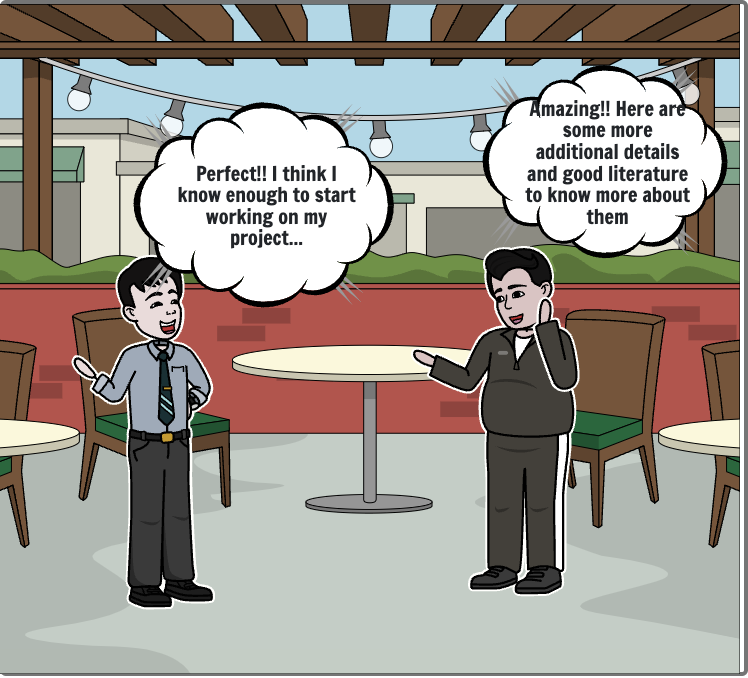

### Now that we have an understanding of the algorithms let's try to understand the limitations and drawbacks of the algorithms and techniques mentioned in this notebook


There are several potential drawbacks of clustering techniques, which are as follows:

- Sensitivity to Initialization: Clustering algorithms can be sensitive to the initial conditions, including the initial choice of centroids. Different initializations can lead to different cluster assignments and results.

- Determining the Optimal Number of Clusters: It can be challenging to determine the optimal number of clusters for a dataset. If the number of clusters is too small, the algorithm may miss important patterns in the data. If the number of clusters is too large, it may lead to overfitting or splitting up clusters with similar characteristics.

- Influence of Outliers: Outliers or noise in the data can impact clustering results. They may lead to the creation of new clusters or pull existing clusters apart, potentially leading to the formation of meaningless or unstable clusters.

- Non-Parametric Nature: Clustering is often considered a non-parametric technique, which means that it does not make any assumptions about the underlying distribution of the data. This can make it more challenging to interpret the results, as there are no clear statistical measures of goodness-of-fit or confidence intervals.

- Interpretability: The results of clustering may not always be easily interpretable, particularly if the clusters are high-dimensional or if there are many clusters. It can be challenging to understand what the clusters represent or how they relate to the original data.

- Scalability: Some clustering algorithms can be computationally expensive, particularly when dealing with large datasets or high-dimensional data. This can make it difficult to scale the algorithms to handle big data problems.

Overall, clustering techniques can be a powerful tool for understanding patterns in data, but their results should be interpreted carefully and validated against other sources of information to ensure their accuracy and usefulness.

<u><b>Let's take K-Means first:</b></u>

1. Sensitivity to Initialization: As I mentioned earlier, the K-Means algorithm can be sensitive to the initial choice of centroids, and different initializations can lead to different cluster assignments and results.
2. Difficulty with Non-Spherical Clusters: K-Means works best with spherical clusters, where the distance metric is Euclidean. It can struggle with non-spherical or irregularly shaped clusters.
3. Determining the Number of Clusters: It can be challenging to determine the optimal number of clusters for a dataset. K-Means requires a predetermined number of clusters to be specified, and selecting an inappropriate number can result in suboptimal clustering results.

##### Illustrating the sensitivity of K-Means to initialization, we run the algorithm multiple times with different initial centroids and compare the resulting cluster assignments

In [69]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans

# Generate random data with three clusters
X, y = make_blobs(n_samples=500, centers=3, random_state=42)

# Run K-Means with two different initializations
km1 = KMeans(n_clusters=4, init='random').fit(X)
km2 = KMeans(n_clusters=4, init='k-means++').fit(X)

# Compare the cluster assignments from each initialization
print('-----------RUN 1---------------------------')
print('Initial centroids:', km1.cluster_centers_)
print('Cluster assignments (random):', km1.labels_)
print('Initial centroids:', km2.cluster_centers_)
print('Cluster assignments (k-means++):', km2.labels_)

print('-----------RUN 2---------------------------')
km1 = KMeans(n_clusters=3, init='random').fit(X)
km2 = KMeans(n_clusters=3, init='k-means++').fit(X)
print('Initial centroids:', km1.cluster_centers_)
print('Cluster assignments (random):', km1.labels_)
print('Initial centroids:', km2.cluster_centers_)
print('Cluster assignments (k-means++):', km2.labels_)

-----------RUN 1---------------------------
Initial centroids: [[-2.51336974  9.03492867]
 [-6.64852228 -7.66468056]
 [ 4.61416263  1.93184055]
 [-6.98546122 -5.98973111]]
Cluster assignments (random): [1 2 2 0 2 2 1 2 2 3 2 0 0 0 2 2 0 3 3 0 2 0 2 1 3 2 2 3 3 0 2 0 0 0 2 2 2
 2 3 1 2 0 0 0 0 2 2 2 2 3 1 0 3 1 2 0 0 3 2 1 3 0 2 1 2 3 2 1 0 2 2 2 2 1
 0 3 0 2 0 0 1 0 2 0 3 1 3 3 2 0 1 2 0 2 2 1 0 0 0 1 2 0 0 3 1 0 0 1 0 1 3
 3 3 1 3 2 0 3 2 1 0 0 2 2 3 2 0 2 3 1 3 2 2 1 2 3 3 3 2 0 1 1 2 2 1 3 3 0
 0 0 2 3 2 2 0 3 0 1 2 2 1 3 0 0 3 0 0 2 1 3 3 0 0 3 1 0 0 2 2 2 0 3 0 0 1
 3 0 2 0 1 3 3 1 1 0 2 0 0 3 2 0 0 3 3 2 1 2 0 0 3 1 2 1 0 0 1 0 1 0 2 2 0
 1 0 2 0 0 1 2 2 2 2 0 3 1 1 0 2 0 2 2 2 0 0 3 1 2 0 0 2 0 0 0 0 2 0 3 0 3
 0 0 0 1 0 2 2 2 0 2 2 0 0 2 1 0 0 0 0 3 3 0 2 0 0 1 0 2 3 2 2 3 0 0 0 1 0
 1 2 2 0 2 3 2 2 0 2 2 2 2 0 2 3 2 2 2 3 3 2 2 0 3 2 2 3 3 1 2 3 1 1 3 1 0
 3 0 1 0 0 1 0 2 2 0 0 2 0 2 0 2 2 2 0 2 3 1 2 3 0 2 0 2 0 2 2 1 0 2 2 0 3
 0 1 0 2 3 0 1 2 3 1 2 3 0 2 3 3 0 2 3 2 3 2 0 0

##### Illustrating the difficulty of K-Means with non-spherical clusters, we generate data with non-spherical clusters using the make_moons function

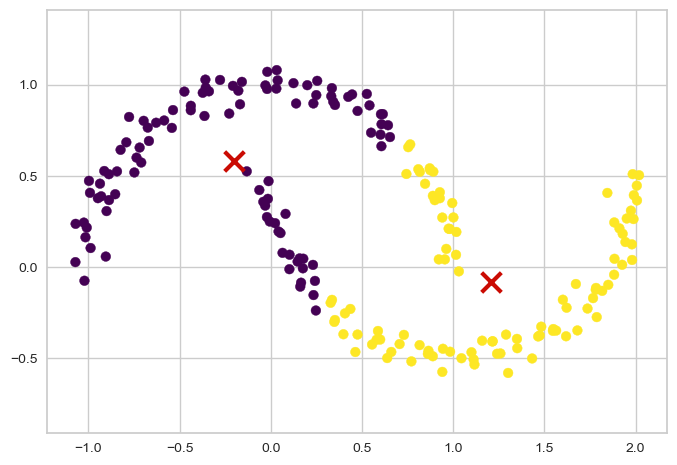

In [70]:
from sklearn.datasets import make_moons

# Generate data with non-spherical clusters
X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

# Run K-Means with two clusters
km = KMeans(n_clusters=2, random_state=0).fit(X)

# Visualize the results
import matplotlib.pyplot as plt
import numpy as np

plt.scatter(X[:, 0], X[:, 1], c=km.labels_)
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:, 1], marker='x', s=200, linewidths=3, color='r', zorder=10)
plt.axis('equal')
plt.show()


We can see that K-Means struggles to cluster the data correctly, since the clusters are not spherical.

<u><b> Let's consider Fuzzy C Means next</u></b>

1. Slower Convergence: Fuzzy C Means typically requires more iterations to converge than K-Means, making it slower for large datasets.
2. Difficulty with Non-Convex Clusters: Fuzzy C Means may struggle with clusters that have non-convex shapes, where data points are located in multiple disjoint regions.
3. Sensitivity to Parameters: The quality of the clustering results can be sensitive to the selection of the fuzziness parameter, which controls the degree of membership of data points to multiple clusters. Choosing an inappropriate value can lead to suboptimal clustering results.

##### Illustrating the slower convergence of Fuzzy C-Means because the other two drawbacks are similar to the drawbacks which we see from K-Means or any kind of distance based clustering algorithm

In [71]:
# Generate a large dataset
X, y = make_blobs(n_samples=10000, centers=5, random_state=42)

# Run K-Means and Fuzzy C Means and time the convergence
start = time.time()
km = KMeans(n_clusters=5, random_state=0).fit(X)
end = time.time()
print('K-Means time:', end - start)

start = time.time()
fcm = FCM(n_clusters=5, m=2, max_iter=100).fit(X)
end = time.time()
print('Fuzzy C Means time:', end - start)


K-Means time: 0.10180306434631348
Fuzzy C Means time: 0.05903911590576172


<u><b> Let's consider Spectral Clustering next</u></b>

1. Scalability: Spectral clustering can be computationally expensive, particularly for large datasets. It involves the computation of the eigenvectors of a similarity matrix, which can be expensive for high-dimensional data.
2. Difficulty with High-Dimensional Data: Spectral clustering can be sensitive to the selection of the similarity measure or kernel. It may struggle with high-dimensional data, where the curse of dimensionality can lead to a loss of structure in the data.
3. Determining the Number of Clusters: Like K-Means, Spectral Clustering requires a predetermined number of clusters to be specified. It can be challenging to determine the optimal number of clusters for a dataset.
4. Fail to separate clusters: One of the drawbacks of Spectral Clustering is that it can fail to separate clusters that are close together or have significant overlap.

##### Scalability, high dimension and determining number of clusters are common drawbacks and we can deal with them by experimenting with the various techniques of even performing dimensionality reduction. But the most important drawback of spectral clustering is it it can fail to separate clusters that are close together or have significant overlap. Illustrating below this particular drawback.

In this code, we generate a dataset with a spiral dataset.If we try to apply spectral clustering to this dataset, we would expect it to separate the points along the spiral into different clusters. However, spectral clustering fails to do so and instead groups the points in a way that doesn't correspond to the underlying structure of the data

This happens because Spectral Clustering relies on the affinity matrix, which measures the similarity between data points, to cluster the data. In cases where the affinity matrix does not capture the underlying structure of the data, such as when clusters are too close or have significant overlap, Spectral Clustering may fail to separate the clusters correctly.

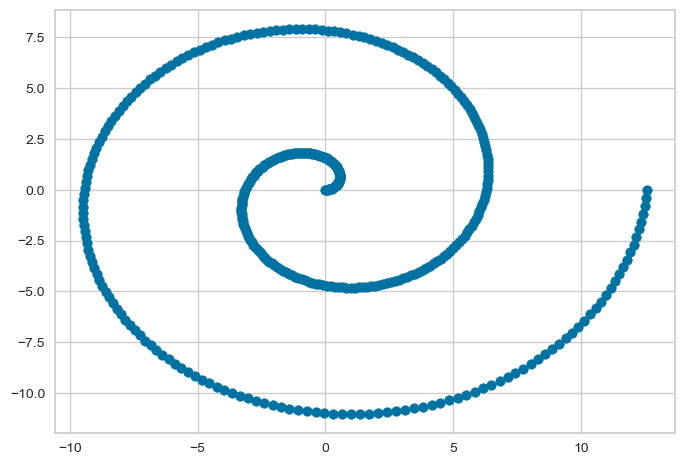

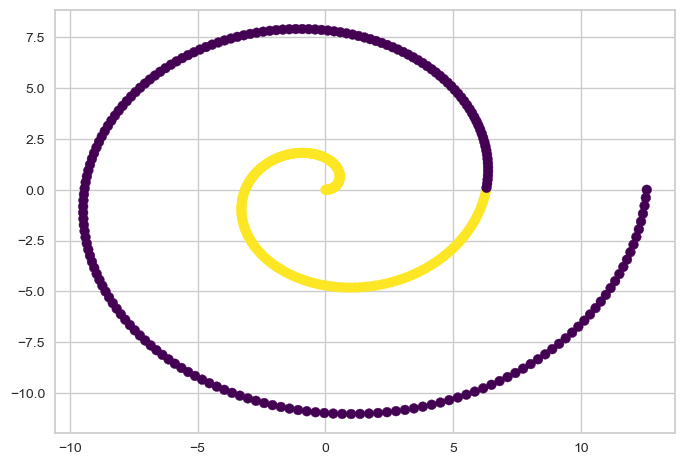

In [72]:
theta = np.linspace(0, 4*np.pi, 400)
x = theta*np.cos(theta)
y = theta*np.sin(theta)
X = np.vstack((x, y)).T

# Plot the dataset
plt.scatter(X[:, 0], X[:, 1])
plt.show()


from sklearn.cluster import SpectralClustering

# Apply spectral clustering to the dataset
sc = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', n_neighbors=10)
labels = sc.fit_predict(X)

# Plot the result
plt.scatter(X[:, 0], X[:, 1], c=labels)
plt.show()


There are a lot of other algorithms which are also available, we have touched upon a few of the famous ones. The methodology is always experimental in nature and by nature there is no free lunch. You have to experiment with different parameters from selecting the number of clusters, different methodologies to find the right set for your data. 

Another famous type of clustering technique is the density based  [DBSCAN](https://towardsdatascience.com/how-dbscan-works-and-why-should-i-use-it-443b4a191c80#:~:text=Density%2Dbased%20spatial%20clustering%20of,data%20mining%20and%20machine%20learning.) and [hierarchical clustering](https://towardsdatascience.com/understanding-the-concept-of-hierarchical-clustering-technique-c6e8243758ec) using dendograms. I have attached some links to explore these other two famous algorithms.

Scikit learn's documentation is extremely detailed here are a few of them which I feel are the most important ones:
- [Main Documentation](https://scikit-learn.org/stable/modules/clustering.html)
- [K-Means](https://scikit-learn.org/stable/modules/clustering.html#k-means)
- [Hierarchical clustering](https://scikit-learn.org/stable/modules/clustering.html#hierarchical-clustering)

